In [ ]:
# https://github.com/shreydan/VisionGPT2

# Image Captioning and VQA with ViT-GPT2

In [1]:
# import gc

%load_ext autoreload
%autoreload 2

# import math
import os
import pickle

import albumentations as A
import numpy as np
import pandas as pd
import torch
import tqdm
from albumentations.pytorch import ToTensorV2

# from IPython.display import clear_output
# from matplotlib import colormaps
from matplotlib import pyplot as plt
from nltk import word_tokenize
from nltk.translate.bleu_score import sentence_bleu
from nltk.translate.meteor_score import meteor_score
from PIL import Image
from rouge import Rouge
from sklearn.model_selection import train_test_split
from timm import create_model

# from timm.layers.patch_embed import PatchEmbed
from timm.models.vision_transformer import VisionTransformer

# import torch.nn as nn
# from torch.nn import functional as F
from torch.cuda.amp import GradScaler

# from transformers import GPT2LMHeadModel
from transformers import GPT2TokenizerFast
from utils import (
    clear_gpu,
    overlay_image,
    plot_training_adv,
    preprocess_text,
    show_image,
    invert_transform,
)
from vitgpt_model import Config, ViTGPT

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

gen = torch.Generator()
gen.manual_seed(0)

tokenizer = GPT2TokenizerFast.from_pretrained("gpt2")
tokenizer.pad_token = tokenizer.eos_token
print(f"{tokenizer.pad_token=}")
test_prompt = "The quick brown fox jumps over the lazy dog"
print(f"{test_prompt=}")
print(tokenizer.encode_plus(test_prompt))


sample_tfms = [
    A.HorizontalFlip(),
    A.RandomBrightnessContrast(),
    A.ColorJitter(),
    A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.3, rotate_limit=45, p=0.5),
    A.HueSaturationValue(p=0.3),
]
train_tfms = A.Compose(
    [
        *sample_tfms,
        A.Resize(224, 224),
        A.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5], always_apply=True),
        ToTensorV2(),
    ]
)
valid_tfms = A.Compose(
    [
        A.Resize(224, 224),
        A.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5], always_apply=True),
        ToTensorV2(),
    ]
)

coco_question_path = "decoco/v2_OpenEnded_mscoco_train2014_questions.json"
coco_annotate_path = "decoco/v2_mscoco_train2014_annotations.json"

e:\ProgramData\anaconda3\envs\cute\lib\site-packages\transformers\utils\hub.py:124: FutureWarning: Using `TRANSFORMERS_CACHE` is deprecated and will be removed in v5 of Transformers. Use `HF_HOME` instead.
  warnings.warn(


cuda
tokenizer.pad_token='<|endoftext|>'
test_prompt='The quick brown fox jumps over the lazy dog'
{'input_ids': [464, 2068, 7586, 21831, 18045, 625, 262, 16931, 3290], 'attention_mask': [1, 1, 1, 1, 1, 1, 1, 1, 1]}


## Coco preprocessing

In [8]:
import json


def parse_answer(annotation):
    question_id = annotation["question_id"]
    image_id = annotation["image_id"]
    answers = [x["answer"] for x in annotation["answers"]]
    longest_answer = max(answers, key=len)

    res = {
        "question_id": question_id,
        "image_id": image_id,
        "longest_answer": longest_answer,
    }

    return res


with open(coco_question_path, "r") as f:
    ms_qst = json.load(f)

with open(coco_annotate_path, "r") as f:
    ms_ann = json.load(f)

ms_qst = pd.DataFrame(ms_qst["questions"])
answers_processed = [parse_answer(annotation) for annotation in ms_ann["annotations"]]
ms_ann = pd.DataFrame(answers_processed)
ms_full_df = pd.merge(ms_qst, ms_ann, on=["question_id", "image_id"])

with open("ms_full_df.pickle", "wb") as file:
    pickle.dump(ms_full_df, file)

In [37]:
answers_processed

[{'question_id': 458752000, 'image_id': 458752, 'longest_answer': 'netting'},
 {'question_id': 458752001, 'image_id': 458752, 'longest_answer': 'pitcher'},
 {'question_id': 458752002, 'image_id': 458752, 'longest_answer': 'orange'},
 {'question_id': 458752003, 'image_id': 458752, 'longest_answer': 'yes'},
 {'question_id': 262146000, 'image_id': 262146, 'longest_answer': 'white'},
 {'question_id': 262146001, 'image_id': 262146, 'longest_answer': 'skiing'},
 {'question_id': 262146002,
  'image_id': 262146,
  'longest_answer': 'red and white'},
 {'question_id': 524291000,
  'image_id': 524291,
  'longest_answer': 'white frisbee'},
 {'question_id': 524291001, 'image_id': 524291, 'longest_answer': 'yes'},
 {'question_id': 524291002, 'image_id': 524291, 'longest_answer': 'frisbee'},
 {'question_id': 393221000, 'image_id': 393221, 'longest_answer': 'yes'},
 {'question_id': 393221001, 'image_id': 393221, 'longest_answer': 'yes'},
 {'question_id': 393221002,
  'image_id': 393221,
  'longest_ans

In [40]:
ms_ann

,question_id,image_id,longest_answer
0,458752000,458752,netting
1,458752001,458752,pitcher
2,458752002,458752,orange
3,458752003,458752,yes
4,262146000,262146,white
...,...,...,...
443752,524286001,524286,black and white
443753,524286002,524286,no
443754,524286003,524286,black
443755,524286004,524286,in case one keyboard breaks


In [16]:
ms_qst

,image_id,question,question_id
0,458752,What is this photo taken looking through?,458752000
1,458752,What position is this man playing?,458752001
2,458752,What color is the players shirt?,458752002
3,458752,Is this man a professional baseball player?,458752003
4,262146,What color is the snow?,262146000
...,...,...,...
443752,524286,What color is the keyboard?,524286001
443753,524286,Is there a computer mouse on the desk?,524286002
443754,524286,What color is the computer?,524286003
443755,524286,Why are there two keyboards?,524286004


In [38]:
ms_qst[ms_qst["question_id"] == 131376006]

,image_id,question,question_id
999,131376,What color is the guy's shirt?,131376006


In [57]:
ms_full_df

,image_id,question,question_id,longest_answer
0,458752,What is this photo taken looking through?,458752000,netting
1,458752,What position is this man playing?,458752001,pitcher
2,458752,What color is the players shirt?,458752002,orange
3,458752,Is this man a professional baseball player?,458752003,yes
4,262146,What color is the snow?,262146000,white
...,...,...,...,...
443752,524286,What color is the keyboard?,524286001,black and white
443753,524286,Is there a computer mouse on the desk?,524286002,no
443754,524286,What color is the computer?,524286003,black
443755,524286,Why are there two keyboards?,524286004,in case one keyboard breaks


In [53]:
with open("ms_full_df.pickle", "rb") as file:
    ms_full_df = pickle.load(file)

In [43]:
ms_full_df.iloc[0]

image_id                                             458752
question          What is this photo taken looking through?
question_id                                       458752000
longest_answer                                      netting
Name: 0, dtype: object

In [44]:
img_id, qst, qst_id, ans = ms_full_df.iloc[0]
img_id, qst, qst_id, ans

(458752, 'What is this photo taken looking through?', 458752000, 'netting')

In [46]:
img_id, qst, qst_id, ans = ms_full_df.iloc[0]

caption = f"[Q]: {qst}[A]: {ans}<|endoftext|>"

input_ids = tokenizer(caption, truncation=True)["input_ids"]

print(input_ids)

for i in input_ids:
    print(tokenizer.decode([i]))

[58, 48, 5974, 1867, 318, 428, 4590, 2077, 2045, 832, 30, 58, 32, 5974, 2010, 889, 50256]
[
Q
]:
 What
 is
 this
 photo
 taken
 looking
 through
?
[
A
]:
 net
ting
<|endoftext|>


## Datasets

In [2]:
class Dataset:
    def __init__(self, df, transforms) -> None:
        self.df = df
        self.tf = transforms

    def __len__(self) -> int:
        return len(self.df)

    def __getitem__(self, idx) -> tuple:
        sample = self.df.iloc[idx]
        image = sample["image_id"]
        caption = sample["caption"]

        image = Image.open(image).convert("RGB")
        image = np.array(image)
        augmented = self.tf(image=image)
        image = augmented["image"]

        caption = f"{caption}<|endoftext|>"

        input_ids = tokenizer(caption, truncation=True)["input_ids"]

        labels = input_ids.copy()
        # Shift right
        labels = input_ids.copy()
        labels[:-1] = input_ids[1:]
        return image, input_ids, labels


class CocoVQADataset:
    def __init__(self, df, transforms, root="decoco/train2014") -> None:
        self.df = df
        self.tf = transforms
        self.root = root

    def __len__(self) -> int:
        return len(self.df)

    def __getitem__(self, idx) -> tuple:
        sample = self.df.iloc[idx]
        image = f'{self.root}/COCO_train2014_{sample["image_id"]:012}.jpg'
        question = sample["question"]
        caption = sample["longest_answer"]

        image = Image.open(image).convert("RGB")
        image = np.array(image)
        augmented = self.tf(image=image)
        image = augmented["image"]

        caption = f"[Q]: {question}[A]: {caption}<|endoftext|>"

        input_ids = tokenizer(caption, truncation=True)["input_ids"]

        labels = input_ids.copy()
        # Shift right
        labels = input_ids.copy()
        labels[:-1] = input_ids[1:]
        return image, input_ids, labels


def collate_fn(batch):
    def padding(input_ids):
        return tokenizer.pad(
            {"input_ids": input_ids},
            padding="longest",
            return_attention_mask=False,
            return_tensors="pt",
        )["input_ids"]

    image, input_ids, labels = zip(*batch)
    image = torch.stack(image, dim=0)
    input_ids = padding(input_ids)
    labels = padding(labels)

    mask = (input_ids != tokenizer.pad_token_id).long()
    labels[mask == 0] = -100
    return image, input_ids, labels

len(train_df)=32364
len(val_df)=8091


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Several children leaping into a pile of leaves on the ground<|endoftext|>


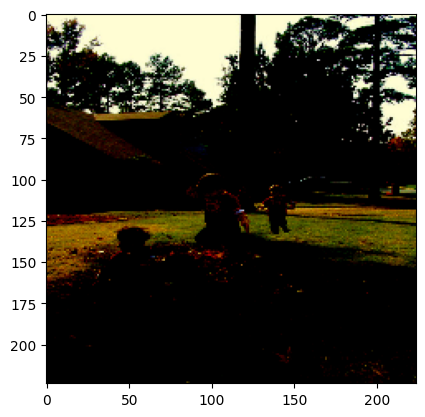

In [5]:
# Flickr8k

base_path = "./Flickr8k_Dataset"
caption_file = "Flickr8k_text/Flickr8k.token.txt"
caption_path = f"{base_path}/{caption_file}"
image_path = f"{base_path}/Flicker8k_Dataset/"

csv_delit = "\t"
capt_delit = "#"
names = ["image_id", "caption"]

captions = pd.read_csv(caption_path, delimiter=csv_delit, header=None, names=names)

captions[names[0]] = captions[names[0]].apply(
    lambda x: f"{image_path}{x.split(capt_delit)[0]}"
)
captions[names[1]] = captions[names[1]].apply(preprocess_text)

# Filter the dataframe to only include rows where the image file exists
captions["isfile"] = captions[names[0]].apply(lambda x: os.path.isfile(x))
captions = captions[captions["isfile"] == True]  # noqa: E712
captions = captions.loc[:, names]

captions.reset_index(drop=True, inplace=True)

train_df, val_df = train_test_split(captions, test_size=0.2, random_state=1)
train_df.reset_index(drop=True, inplace=True)
val_df.reset_index(drop=True, inplace=True)
print(f"{len(train_df)=}\n{len(val_df)=}")

train_ds = Dataset(train_df, train_tfms)
val_ds = Dataset(val_df, valid_tfms)

image, input_ids, labels = val_ds[0]
show_image(image)
print(tokenizer.decode(input_ids))

In [3]:
with open("ms_full_df.pickle", "rb") as file:
    ms_full_df = pickle.load(file)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


len(train_df)=40000
len(val_df)=10000
[Q]: What kind of cat is this?[A]: fluffy cat<|endoftext|>


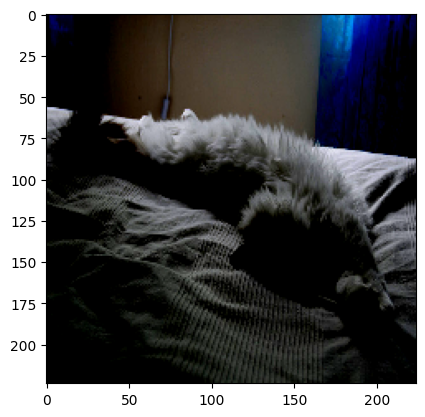

In [4]:
ms_short = ms_full_df.head(50_000)
train_df, val_df = train_test_split(ms_short, test_size=0.2, random_state=1)
train_df.reset_index(drop=True, inplace=True)
val_df.reset_index(drop=True, inplace=True)
print(f"{len(train_df)=}\n{len(val_df)=}")

train_ds = CocoVQADataset(train_df, train_tfms, "decoco/train2014")
val_ds = CocoVQADataset(val_df, valid_tfms, "decoco/train2014")

image, input_ids, labels = val_ds[0]
show_image(image)
print(tokenizer.decode(input_ids))

In [5]:
train_df.head()

,image_id,question,question_id,longest_answer
0,398406,Where is the hat?,398406001,in man's hand
1,403463,Does one dessert have more chocolate than anot...,403463003,yes
2,3827,Are both men a healthy weight?,3827013,yes
3,402603,Does this meal appear to be bland or well spiced?,402603003,spiced
4,273783,What event is celebrated here?,273783002,wedding


In [ ]:
captions.head()

## Training

In [6]:
class Trainer:
    def __init__(
        self,
        vit_model: VisionTransformer,
        model_config: Config,
        train_loader,
        val_loader,
        model_name="caption_transformer",
    ) -> None:
        self.config = model_config
        self.model = ViTGPT.from_pretrained(vit_model, model_config)
        self.model = self.model.to(device)
        self.model.pretrained_layers_trainable(trainable=False)
        print(
            f"trainable parameters: {sum([p.numel() for p in self.model.parameters() if p.requires_grad])}"
        )
        self.tokenizer = GPT2TokenizerFast.from_pretrained("gpt2")
        self.tokenizer.pad_token = self.tokenizer.eos_token
        self.scaler = GradScaler()
        self.train_loader, self.val_loader = train_loader, val_loader
        self.total = len(train_loader)
        self.optim = torch.optim.Adam(self.model.parameters(), lr=0.001)
        self.metrics = pd.DataFrame()
        self.metrics[
            ["train_loss", "train_perplexity", "val_loss", "val_perplexity"]
        ] = None

        self.model_name = model_name
        self.losses = []
        self.perplexities = []
        self.curr_epoch = 0

    def save_model(self):
        torch.save(
            {
                "config": self.config,
                "model_state_dict": self.model.state_dict(),
                "metrics": self.metrics,
                "losses": self.losses,
                "perplexities": self.perplexities,
                "curr_epoch": self.curr_epoch,
            },
            f"{self.model_name}_{self.curr_epoch}.pth",
        )

    def load_model(self, model_path):
        checkpoint = torch.load(model_path)
        self.metrics = checkpoint["metrics"]
        self.config = checkpoint["config"]
        self.losses = checkpoint["losses"]
        self.perplexities = checkpoint["perplexities"]
        self.curr_epoch = checkpoint["curr_epoch"]
        self.model.load_state_dict(checkpoint["model_state_dict"])

    def train(self, num_epochs=1, log_freq=1, do_plot=True, clear_freq=100):
        self.model.train()
        for epoch in range(num_epochs):
            running_loss = 0.0
            for i, (image, input_ids, labels) in tqdm.tqdm(
                enumerate(self.train_loader), total=self.total
            ):
                image, input_ids, labels = (
                    image.to(device),
                    input_ids.to(device),
                    labels.to(device),
                )

                loss = self.model(image, input_ids, labels)
                self.scaler.scale(loss).backward()
                self.scaler.step(self.optim)
                self.scaler.update()
                self.optim.zero_grad(set_to_none=True)
                curr_loss = loss.item()
                curr_plex = np.exp(loss.item())
                running_loss += curr_loss
                self.losses.append(curr_loss)
                self.perplexities.append(curr_plex)

                if i % log_freq == 0:
                    if do_plot:
                        plot_training_adv(self.losses, self.perplexities)

                    print(
                        f"[{epoch}/{num_epochs}] Step: [{i}/{self.total}] "
                        f"Loss: {curr_loss:.5f} \t Perplexity: {curr_plex:.5f}"
                    )

                del image, input_ids, labels
                if i != 0 and i % clear_freq == 0:
                    clear_gpu()

            train_loss = running_loss / self.total
            train_pxp = np.exp(train_loss)

            self.metrics.loc[self.curr_epoch, ["train_loss", "train_perplexity"]] = (
                train_loss,
                train_pxp,
            )

            self.curr_epoch += epoch + 1

In [7]:
vit = create_model("vit_base_patch16_224", pretrained=True, num_classes=0)

You're using a GPT2TokenizerFast tokenizer. Please note that with a fast tokenizer, using the `__call__` method is faster than using a method to encode the text followed by a call to the `pad` method to get a padded encoding.
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


c[0]=tensor([   58,    48,  5974,  1867,  5044,   318,   287,   262,  4286,    30,
           58,    32,  5974, 37370, 21223, 50256, 50256, 50256, 50256, 50256,
        50256, 50256, 50256, 50256, 50256, 50256, 50256, 50256])
[Q]: What animal is in the picture?[A]: giraffe<|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>
l[0]=tensor([   48,  5974,  1867,  5044,   318,   287,   262,  4286,    30,    58,
           32,  5974, 37370, 21223, 50256,  -100,  -100,  -100,  -100,  -100,
         -100,  -100,  -100,  -100,  -100,  -100,  -100,  -100])


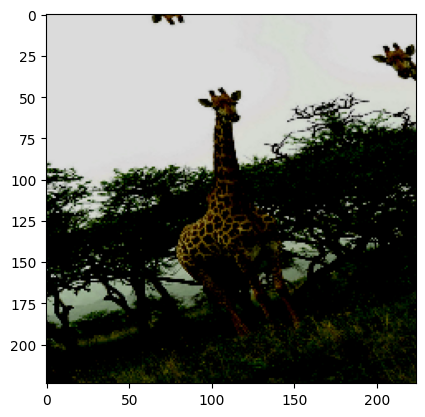

In [64]:
config = Config(
    embed_dim=768,
    seq_len=1024,
    n_head=12,
    bias=True,
    dropout_p=0.1,
    mlp_ratio=4,
    depth=12,
    vocab_size=50_257,
)

batch_size = 32

train_loader = torch.utils.data.DataLoader(
    train_ds, shuffle=False, batch_size=batch_size, collate_fn=collate_fn
)
val_loader = torch.utils.data.DataLoader(
    val_ds, shuffle=False, batch_size=batch_size, collate_fn=collate_fn
)
img, c, l = next(iter(train_loader))
show_image(img[0])
print(f"{c[0]=}")
print(tokenizer.decode(c[0]))
print(f"{l[0]=}")

## Train flickr

You're using a GPT2TokenizerFast tokenizer. Please note that with a fast tokenizer, using the `__call__` method is faster than using a method to encode the text followed by a call to the `pad` method to get a padded encoding.
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


c[0]=tensor([  464,  4346,  2137, 12049,   287,  2266,  3073,   866,  2214, 50256,
        50256, 50256, 50256, 50256, 50256, 50256, 50256, 50256, 50256, 50256,
        50256, 50256])
The football player dressed in red looks down field<|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>
l[0]=tensor([ 4346,  2137, 12049,   287,  2266,  3073,   866,  2214, 50256,  -100,
         -100,  -100,  -100,  -100,  -100,  -100,  -100,  -100,  -100,  -100,
         -100,  -100])


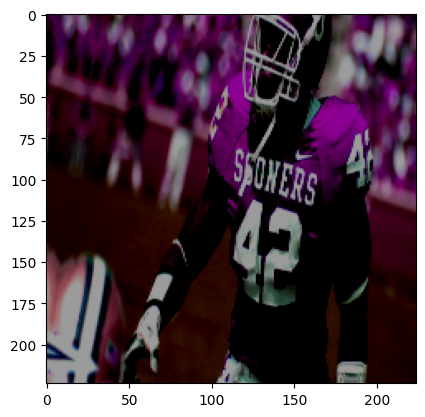

In [9]:
config = Config(
    embed_dim=768,
    seq_len=1024,
    n_head=12,
    bias=True,
    dropout_p=0.1,
    mlp_ratio=4,
    depth=12,
    vocab_size=50_257,
)

batch_size = 32

train_loader = torch.utils.data.DataLoader(
    train_ds, shuffle=False, batch_size=batch_size, collate_fn=collate_fn
)
val_loader = torch.utils.data.DataLoader(
    val_ds, shuffle=False, batch_size=batch_size, collate_fn=collate_fn
)
img, c, l = next(iter(train_loader))
show_image(img[0])
print(f"{c[0]=}")
print(tokenizer.decode(c[0]))
print(f"{l[0]=}")

In [24]:
clear_gpu()

In [65]:
the_trainer = Trainer(vit, config, train_loader, val_loader)

total_frozen_params=210236928
trainable parameters: 28366848


In [26]:
the_trainer.load_model("models/caption_transformer_10.pth")

In [ ]:
# Training the Cross Attention with all other weight frozen
the_trainer.train(1, 1, True)

In [27]:
the_trainer.metrics

,train_loss,train_perplexity,val_loss,val_perplexity
0,3.977757,53.397124,NaN,NaN
1,3.178797,24.01785,NaN,NaN
2,2.703653,14.93419,NaN,NaN
3,2.439818,11.470948,NaN,NaN
4,2.217619,9.185435,NaN,NaN
5,2.084812,8.043083,NaN,NaN
6,1.905852,6.725135,NaN,NaN
7,1.740999,5.703038,NaN,NaN
8,1.584956,4.879077,NaN,NaN
9,1.434973,4.199532,NaN,NaN


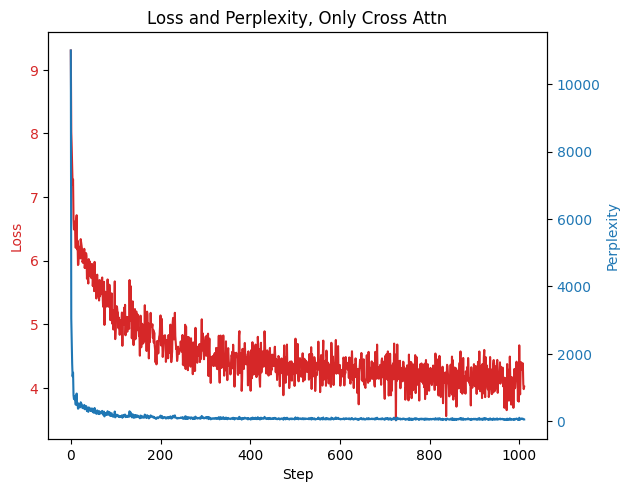

,train_loss,train_perplexity,val_loss,val_perplexity
0,4.530788,92.831659,NaN,NaN


In [74]:
plot_training_adv(
    the_trainer.losses,
    the_trainer.perplexities,
    title="Loss and Perplexity, Only Cross Attn",
)
the_trainer.metrics

## Eval

In [8]:
def val_inference(idx, show=True):
    the_trainer.model.eval()
    test_image, test_input, test_label = val_ds[idx]
    if show:
        test_ground_truth = tokenizer.decode(test_input, skip_special_tokens=True)
    test_image_tensor = test_image.unsqueeze(0).to(device)
    sequence = torch.ones(1, 1).to(device).long() * tokenizer.bos_token_id

    output, all_attn_weights = the_trainer.model.generate(
        test_image_tensor,
        sequence,
        max_tokens=50,
        temperature=1.0,
        deterministic=True,
        eos_token_id=50256,
    )

    caption = tokenizer.decode(output.numpy(), skip_special_tokens=True)
    recover_img = None
    if show:
        recover_img = invert_transform(test_image)
        show_image(
            recover_img, title=f"Ground Truth: {test_ground_truth}\nPredict: {caption}"
        )

    return caption, all_attn_weights, recover_img


def validate(trim=0):
    the_trainer.model.eval()
    bleu_scores = {1: [], 2: [], 3: [], 4: [], 5: []}
    meteor_scores = []
    rouge_scores = []
    rouge = Rouge()

    for idx in tqdm.tqdm(range(len(val_ds))):
        with torch.no_grad():
            caption, _, _ = val_inference(idx, False)

        # Get the ground truth caption
        _, test_input, _ = val_ds[idx]
        ground_truth = tokenizer.decode(test_input, skip_special_tokens=True)

        # Tokenize the ground truth and generated caption
        tokenized_gt = word_tokenize(ground_truth)
        tokenized_ct = word_tokenize(caption)

        # Calculate the BLEU scores for different n-grams
        for n in range(1, 6):
            weights = (
                [1.0 / n] * n + [0.0] * (5 - n)
            )  # gives equal weight to each n-gram up to n, zero weight to n-grams for n+1 to 5
            bleu_score = sentence_bleu([tokenized_gt], tokenized_ct, weights=weights)
            bleu_scores[n].append(bleu_score)

        # Calculate the METEOR score
        meteor = meteor_score([tokenized_gt], tokenized_ct)
        meteor_scores.append(meteor)

        # Calculate the ROUGE score
        if caption:
            rouge_score = rouge.get_scores(caption, ground_truth, avg=True)
            rouge_scores.append(rouge_score["rouge-l"]["f"])
        else:
            rouge_score = 0
            rouge_scores.append(rouge_score)

        if trim != 0 and idx == trim:
            break

    avg_bleu_scores = {
        n: sum(scores) / len(scores) for n, scores in bleu_scores.items()
    }
    avg_meteor_score = sum(meteor_scores) / len(meteor_scores)
    avg_rouge_score = sum(rouge_scores) / len(rouge_scores)

    return avg_bleu_scores, avg_meteor_score, avg_rouge_score

## Bleu

In [372]:
avg_bleu_score, avg_meteor_score, avg_rouge_score = validate()

  0%|          | 0/8091 [00:00<?, ?it/s]

100%|██████████| 8091/8091 [41:21<00:00,  3.26it/s]  


In [373]:
avg_bleu_score, avg_meteor_score, avg_rouge_score

({1: 0.23675050668283062,
  2: 0.11446760162415524,
  3: 0.05027175454710044,
  4: 0.020503423759708463,
  5: 0.00920079701668468},
 0.2534816136174951,
 0.29886110416056605)

In [32]:
epoc = 10

evaldict = {
    "model_name": f"caption_transformer_{epoc}",
    "bleu_scores": avg_bleu_score,
    "meteor_score": avg_meteor_score,
    "rouge_score": avg_rouge_score,
}

with open(f"evaldict_{epoc}.pickle", "wb") as file:
    pickle.dump(evaldict, file)

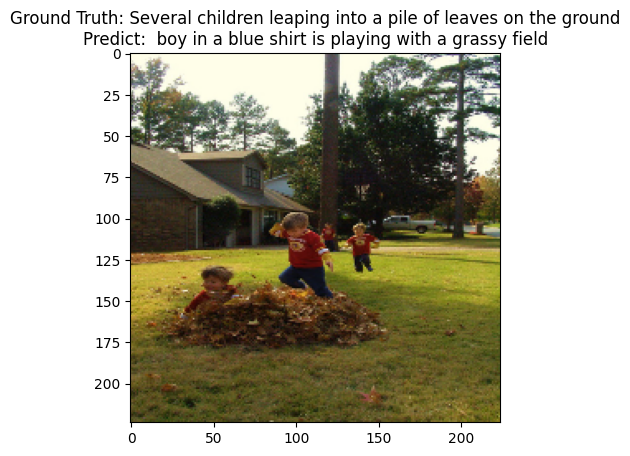

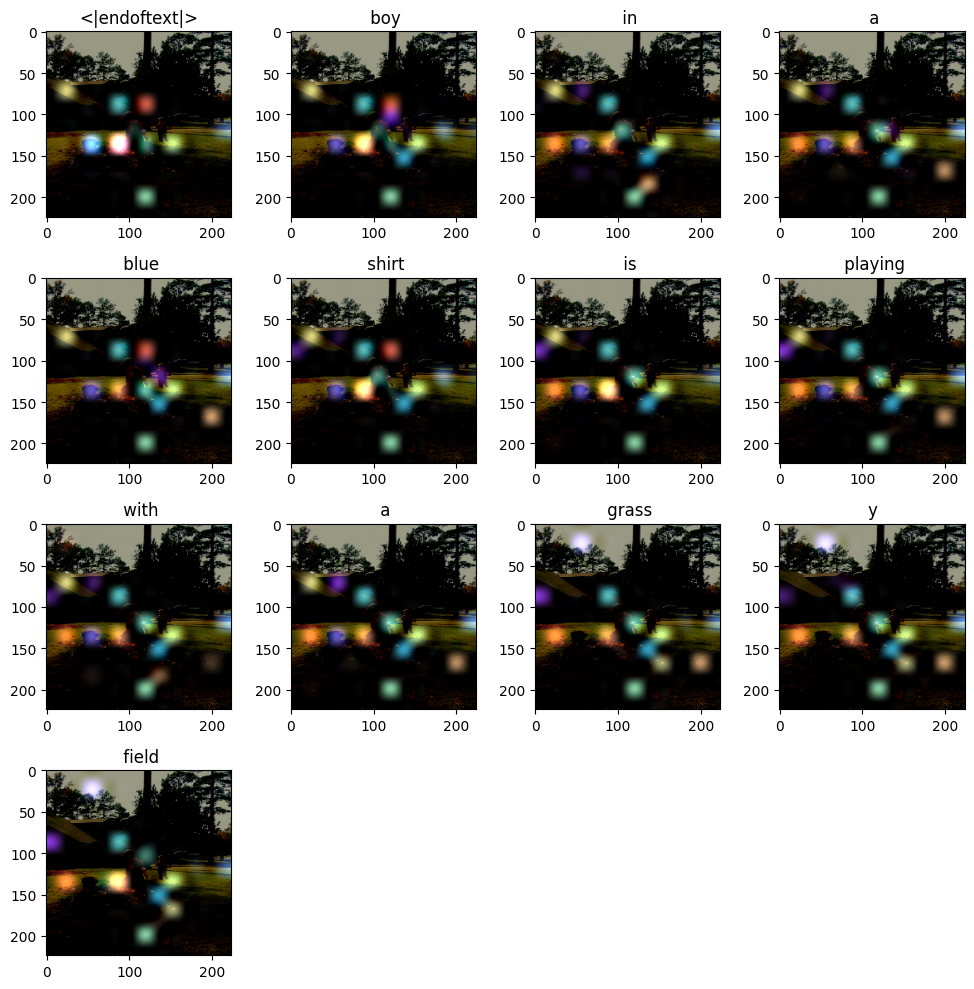

In [419]:
caption, all_attn_weights, recover_img = val_inference(0)

sequences = [i.cpu() for i in all_attn_weights.keys()]
attn_weights = [i.cpu() for i in all_attn_weights.values()]

# assuming tensor 't' is your tensor
t = attn_weights[-1].squeeze()
t = t[:, :, 1:]
t = t.view(t.shape[0], t.shape[1], -1, 14, 14)
overlay_image(t, recover_img, sequences, tokenizer)

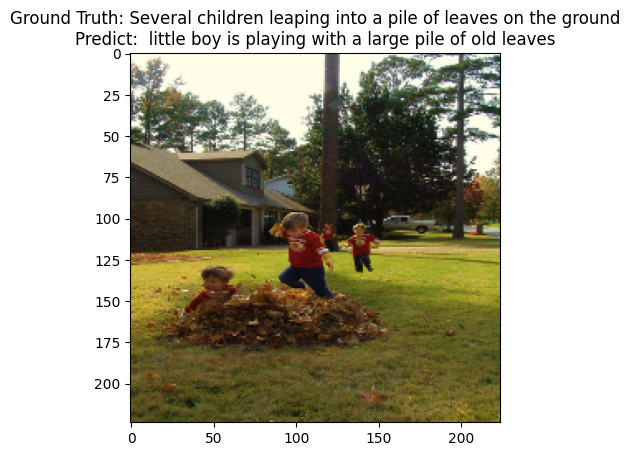

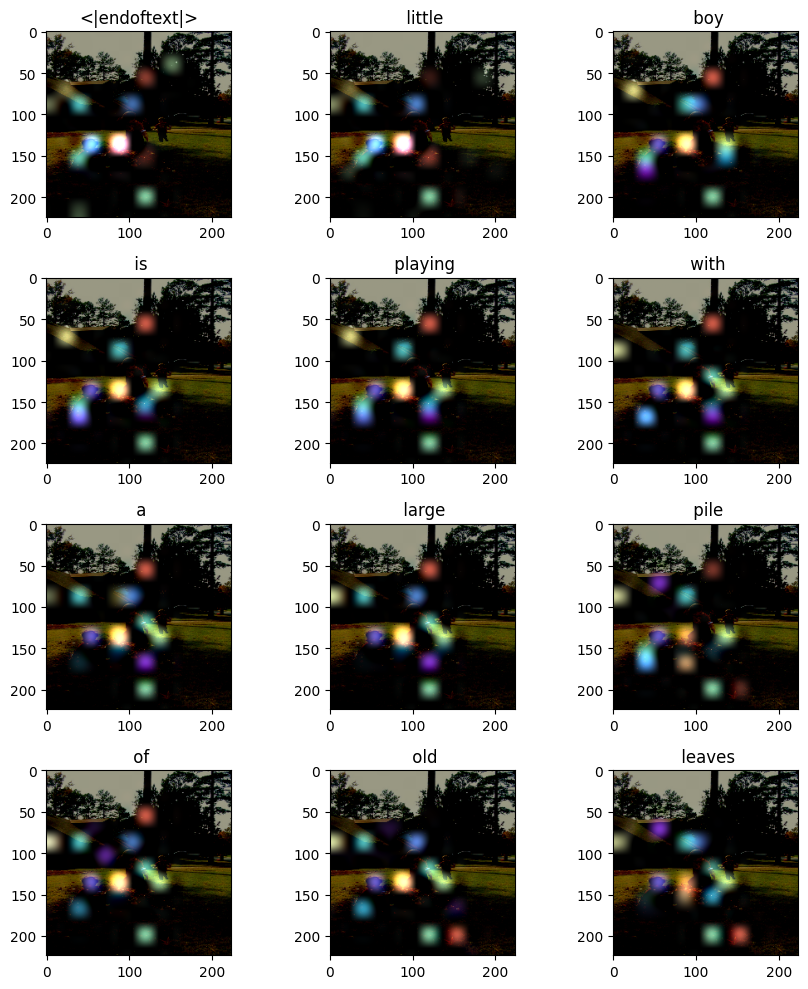

In [287]:
caption, all_attn_weights, recover_img = val_inference(0)

sequences = [i.cpu() for i in all_attn_weights.keys()]
attn_weights = [i.cpu() for i in all_attn_weights.values()]

# assuming tensor 't' is your tensor
t = attn_weights[-1].squeeze()
t = t[:, :, 1:]
t = t.view(t.shape[0], t.shape[1], -1, 14, 14)
overlay_image(t, recover_img, sequences, tokenizer)

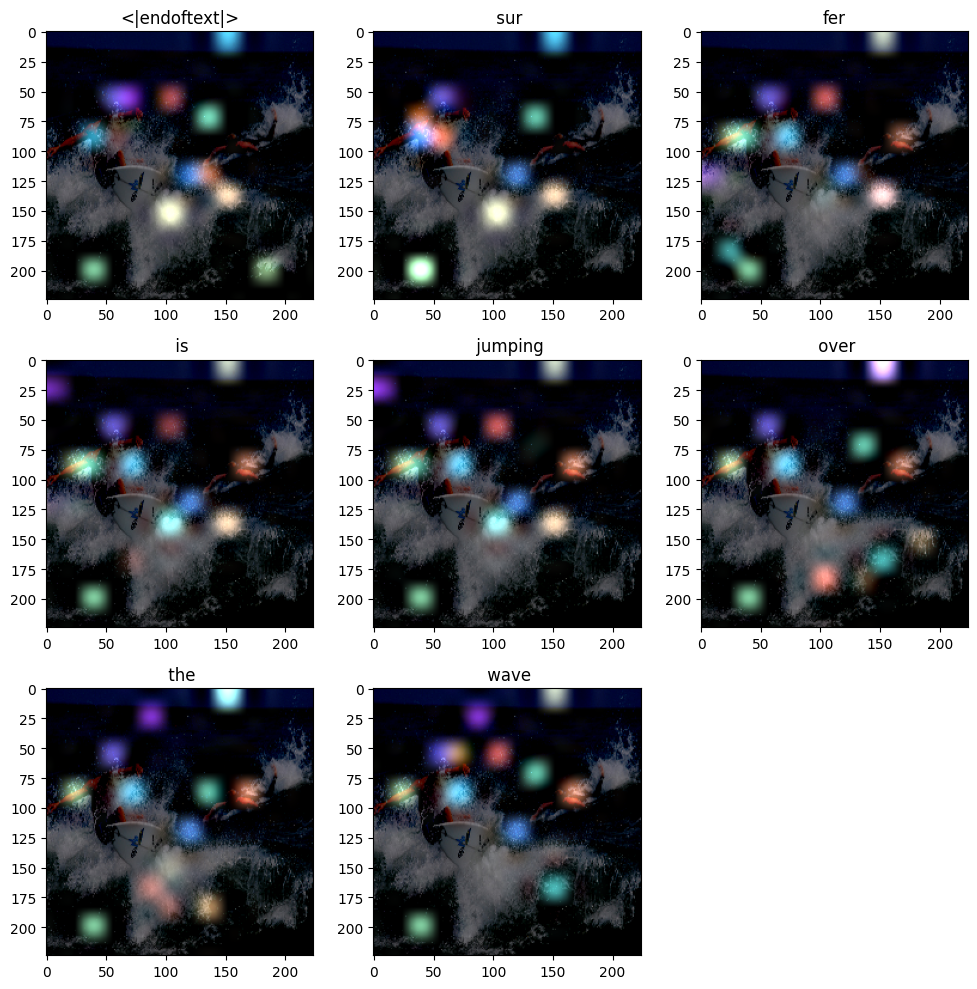

In [214]:
# assuming tensor 't' is your tensor
t = attn_weights[-1].squeeze()
t = t[:, :, 1:]
t = t.view(t.shape[0], t.shape[1], -1, 14, 14)
overlay_image(t, recover_img, sequences, tokenizer)

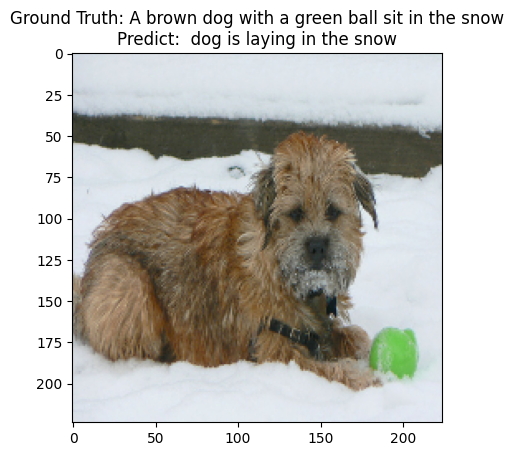

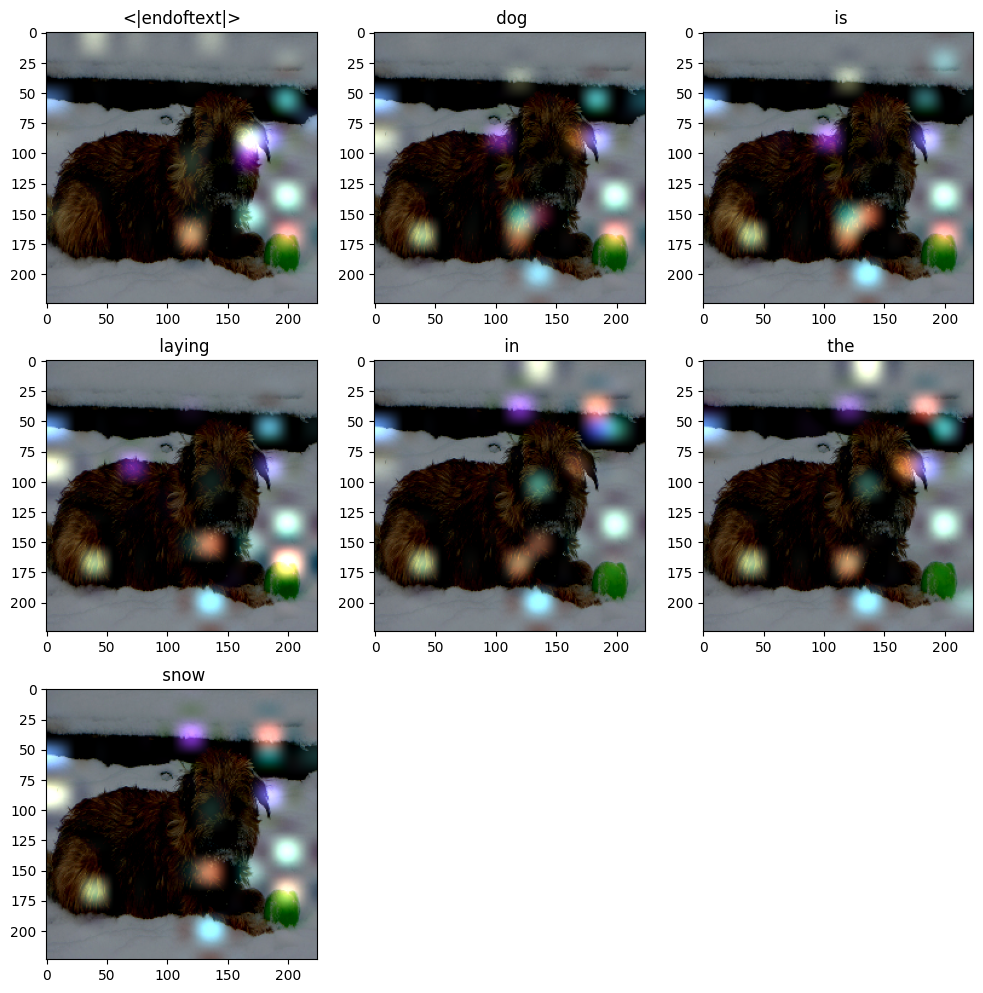

In [384]:
caption, all_attn_weights, recover_img = val_inference(55)

sequences = [i.cpu() for i in all_attn_weights.keys()]
attn_weights = [i.cpu() for i in all_attn_weights.values()]
t = attn_weights[-1].squeeze()
t = t[:, :, 1:]
t = t.view(t.shape[0], t.shape[1], -1, 14, 14)
overlay_image(t, recover_img, sequences, tokenizer)

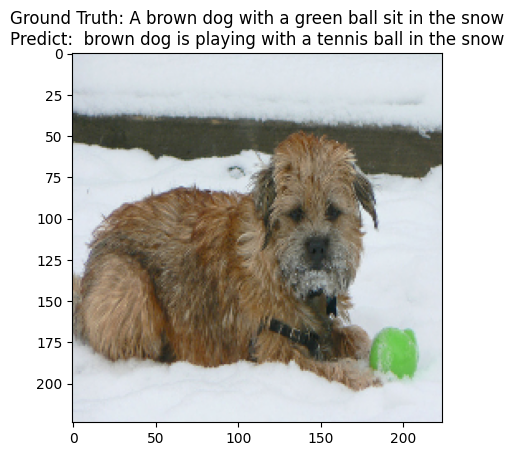

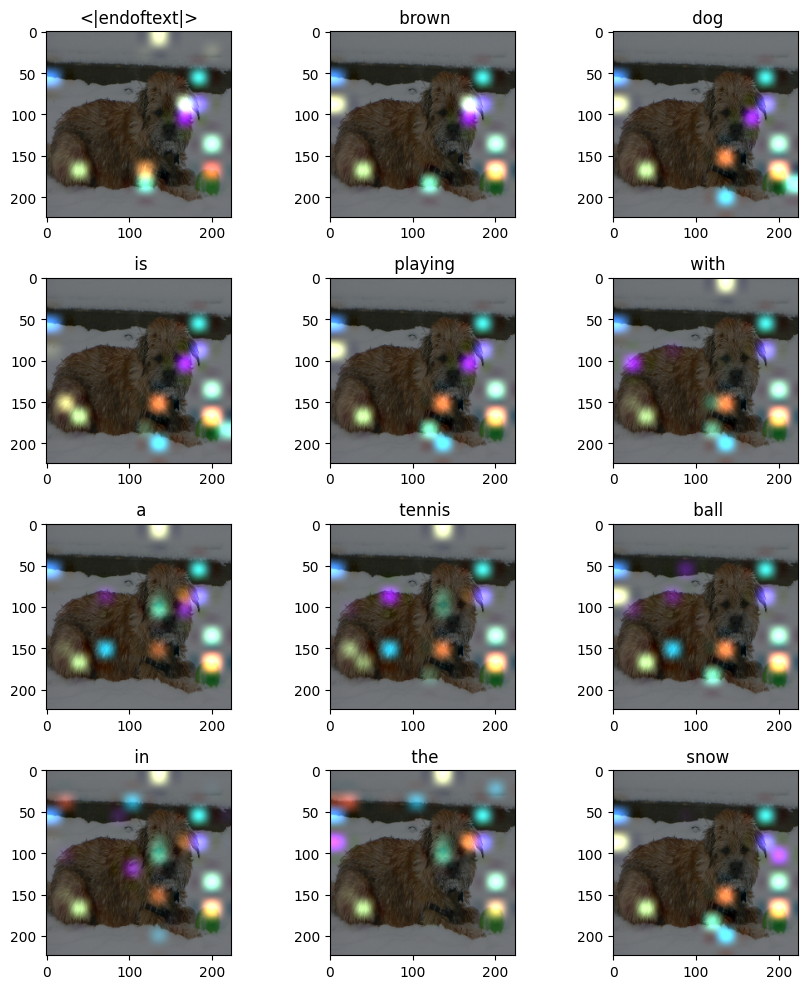

In [190]:
caption, all_attn_weights, recover_img = val_inference(55)

sequences = [i.cpu() for i in all_attn_weights.keys()]
attn_weights = [i.cpu() for i in all_attn_weights.values()]
t = attn_weights[-1].squeeze()
t = t[:, :, 1:]
t = t.view(t.shape[0], t.shape[1], -1, 14, 14)
overlay_image(t, recover_img, sequences, tokenizer)

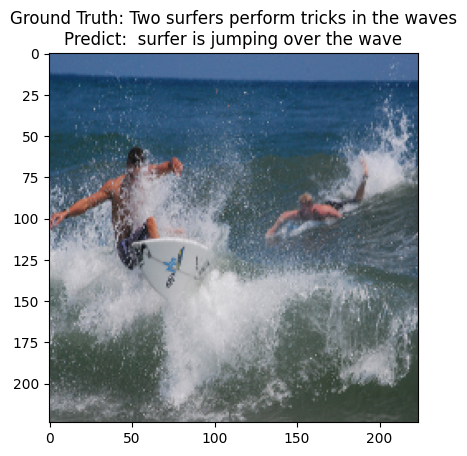

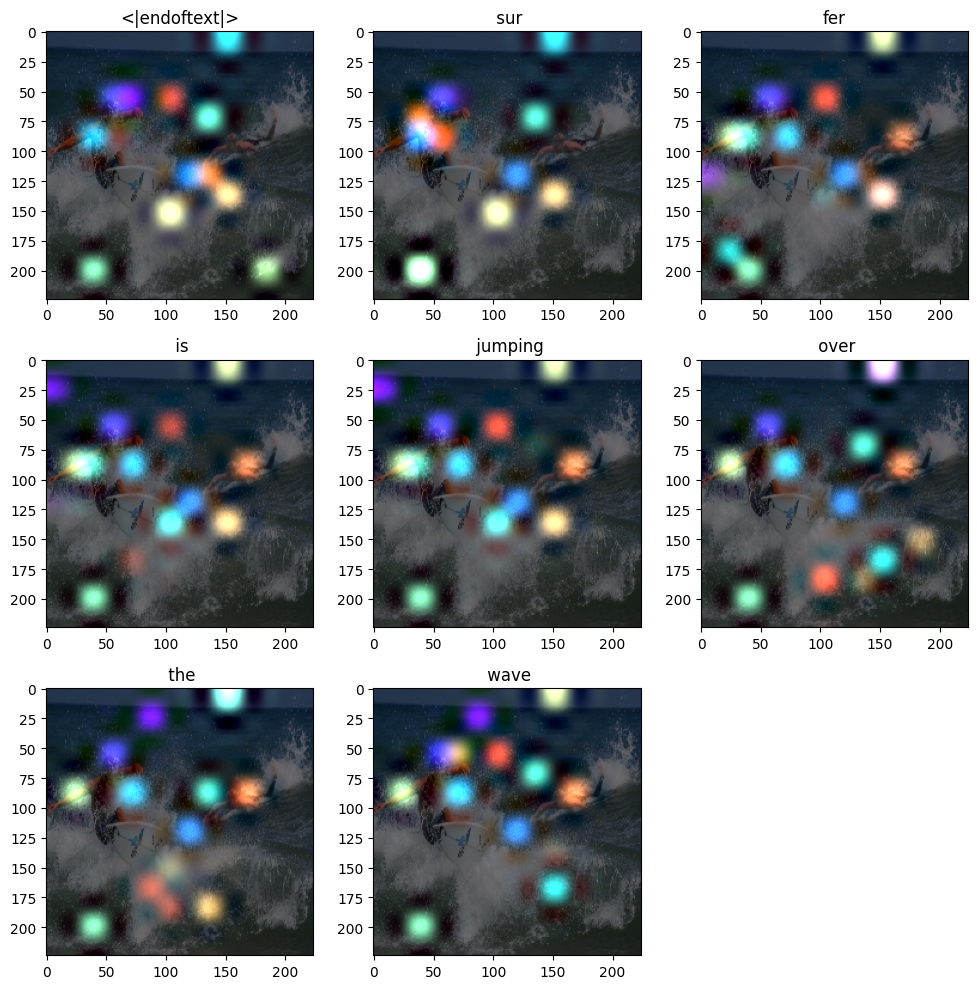

In [195]:
caption, all_attn_weights, recover_img = val_inference(1234)

sequences = [i.cpu() for i in all_attn_weights.keys()]
attn_weights = [i.cpu() for i in all_attn_weights.values()]
t = attn_weights[-1].squeeze()
t = t[:, :, 1:]
t = t.view(t.shape[0], t.shape[1], -1, 14, 14)
overlay_image(t, recover_img, sequences, tokenizer)

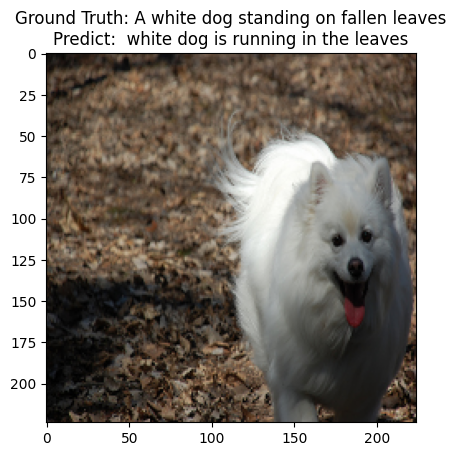

In [20]:
val_inference(15)

In [38]:
the_trainer.save_model()

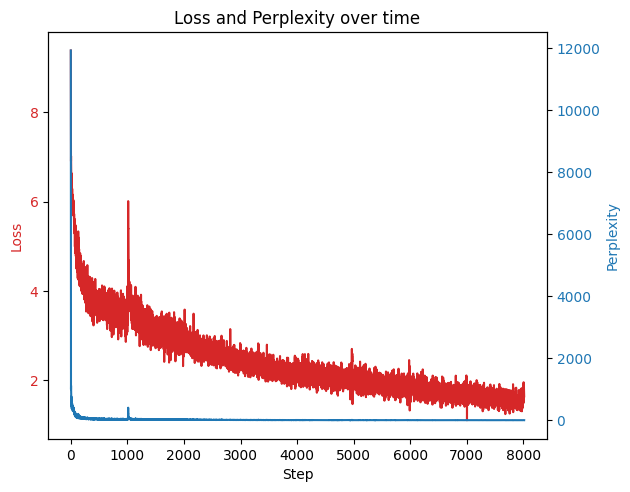

100%|█████████▉| 1011/1012 [13:05<00:00,  1.21it/s]

[0/1] Step: [1010/1012] Loss: 1.63134 	 Perplexity: 5.11071


100%|██████████| 1012/1012 [13:05<00:00,  1.29it/s]


In [28]:
# Unfreeze GPT2
the_trainer.model.unfreeze_gpt_layers()
the_trainer.train(1, 5, True)

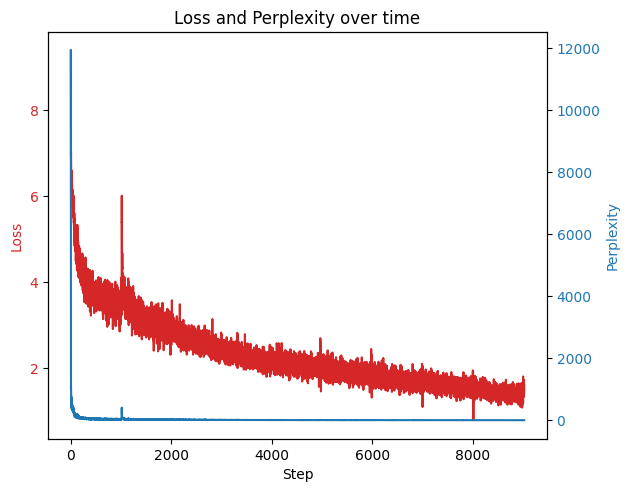

100%|█████████▉| 1011/1012 [13:33<00:00,  1.23it/s]

[0/1] Step: [1010/1012] Loss: 1.48574 	 Perplexity: 4.41826


100%|██████████| 1012/1012 [13:33<00:00,  1.24it/s]


In [33]:
the_trainer.train(1, 5, True)

In [385]:
the_trainer.metrics

,train_loss,train_perplexity,val_loss,val_perplexity
0,3.977757,53.397124,NaN,NaN
1,3.178797,24.01785,NaN,NaN
2,2.703653,14.93419,NaN,NaN
3,2.439818,11.470948,NaN,NaN


In [34]:
the_trainer.metrics

,train_loss,train_perplexity,val_loss,val_perplexity
0,3.977757,53.397124,NaN,NaN
1,3.178797,24.01785,NaN,NaN
2,2.703653,14.93419,NaN,NaN
3,2.439818,11.470948,NaN,NaN
4,2.217619,9.185435,NaN,NaN
5,2.084812,8.043083,NaN,NaN
6,1.905852,6.725135,NaN,NaN
7,1.740999,5.703038,NaN,NaN
8,1.584956,4.879077,NaN,NaN
9,1.434973,4.199532,NaN,NaN


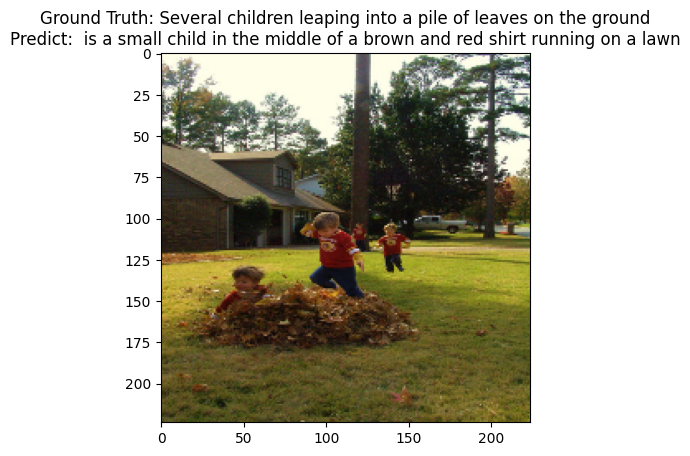

In [35]:
val_inference(0)

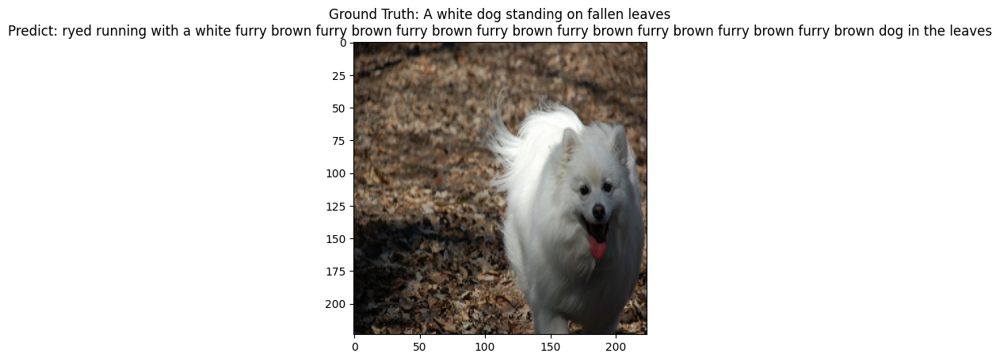

In [36]:
val_inference(15)

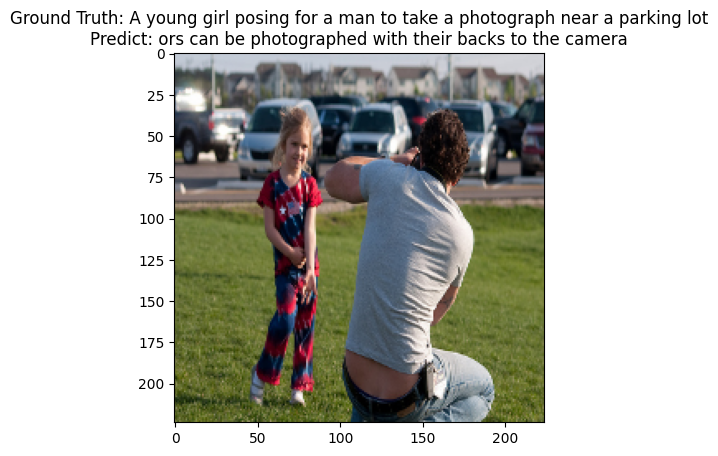

In [37]:
val_inference(36)

In [23]:
the_trainer.save_model()

In [21]:
clear_gpu()

In [18]:
# Unfreeze GPT2
the_trainer.model.unfreeze_gpt_layers()

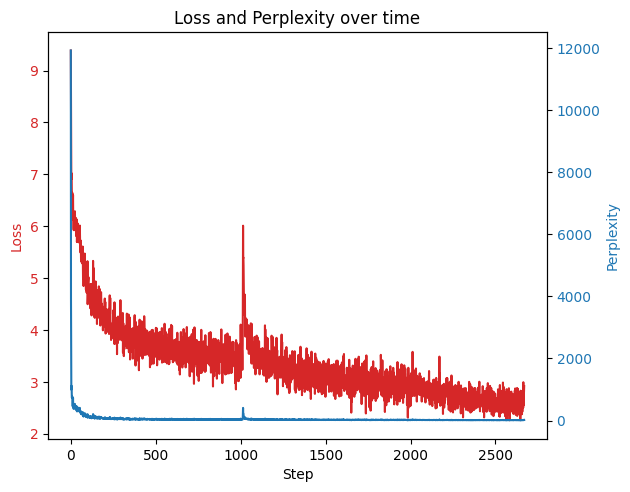

100%|█████████▉| 646/648 [12:48<00:02,  1.24s/it]

[0/1] Step: [645/648] Loss: 2.91631 	 Perplexity: 18.47297


100%|██████████| 648/648 [12:49<00:00,  1.19s/it]


In [19]:
the_trainer.train(1, 5, True)

In [20]:
the_trainer.metrics

,train_loss,train_perplexity,val_loss,val_perplexity
0,3.977757,53.397124,NaN,NaN
1,3.178797,24.01785,NaN,NaN
2,2.703653,14.93419,NaN,NaN


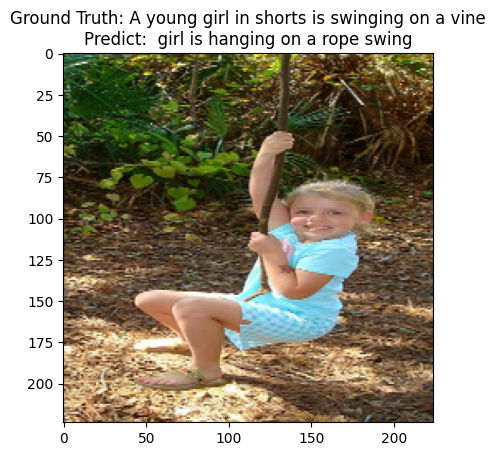

In [28]:
val_inference(1377)

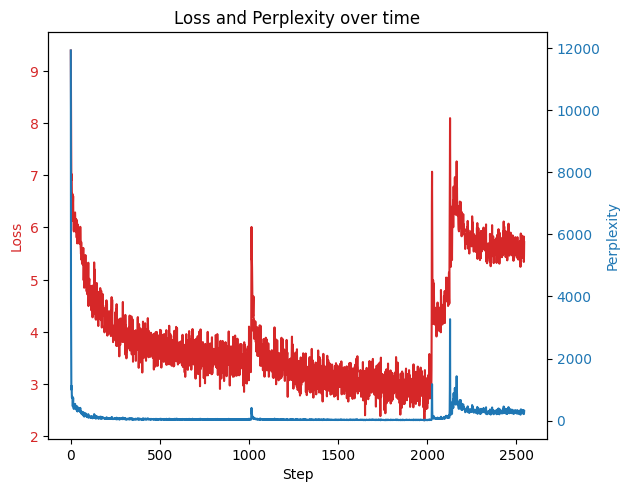

 51%|█████▏    | 521/1012 [13:02<12:29,  1.53s/it]

[0/1] Step: [520/1012] Loss: 5.71907 	 Perplexity: 304.62032


 52%|█████▏    | 523/1012 [13:05<11:55,  1.46s/it]

In [32]:
# Unfreeze all (WILL MAKE IT WORSE AND HUGE MEMORY USE)
the_trainer.model.pretrained_layers_trainable(trainable=True)
the_trainer.train(1, 5, True)

In [68]:
evalings = []
for i in range(1, 11):
    with open(f"evals/evaldict_{i}.pickle", "rb") as file:
        evalings.append(pickle.load(file))

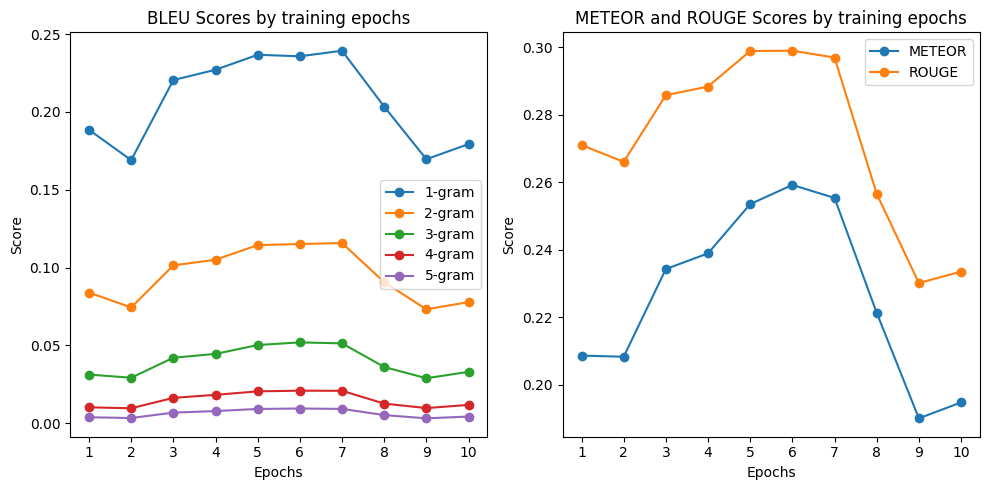

In [84]:
model_names = [d["model_name"][20:] for d in evalings]
bleu_scores = [d["bleu_scores"] for d in evalings]
meteor_scores = [d["meteor_score"] for d in evalings]
rouge_scores = [d["rouge_score"] for d in evalings]

# Create a figure and a set of subplots
fig, axs = plt.subplots(1, 2, figsize=(10, 5))


# Plot BLEU scores
for ngram in range(1, 6):
    scores = [scores[ngram] for scores in bleu_scores]
    axs[0].plot(model_names, scores, marker="o", label=f"{ngram}-gram")

# Set title and labels for the first subplot
axs[0].set_title("BLEU Scores by training epochs")
axs[0].set_xlabel("Epochs")
axs[0].set_ylabel("Score")

# Add a legend to the first subplot
axs[0].legend()

# Plot METEOR and ROUGE scores
axs[1].plot(model_names, meteor_scores, marker="o", label="METEOR")
axs[1].plot(model_names, rouge_scores, marker="o", label="ROUGE")

# Set title and labels for the second subplot
axs[1].set_title("METEOR and ROUGE Scores by training epochs")
axs[1].set_xlabel("Epochs")
axs[1].set_ylabel("Score")

# Add a legend to the second subplot
axs[1].legend()

# Adjust the layout
plt.tight_layout()

# Show the plot
plt.show()


# plt.xticks(rotation=90, ha='right')

## Coco

In [41]:
def save_adv(the_trainer, special_name):
    torch.save(
        {
            "config": the_trainer.config,
            "model_state_dict": the_trainer.model.state_dict(),
            "metrics": the_trainer.metrics,
            "losses": the_trainer.losses,
            "perplexities": the_trainer.perplexities,
            "curr_epoch": the_trainer.curr_epoch,
        },
        f"{special_name}_{the_trainer.model_name}_{the_trainer.curr_epoch}.pth",
    )

def find_sublist(lst, sublist):
    sub_len = len(sublist)
    for i in range(len(lst)):
        if lst[i:i+sub_len] == sublist:
            return i+sub_len
    return -1  # return -1 if sublist is not found

def val_inference_vqa(idx, show=True):
    the_trainer.model.eval()
    test_image, test_input, test_label = val_ds[idx]
    test_input_truncated = test_input[:find_sublist(test_input, [58, 32, 5974])]
    if show:
        test_ground_truth = tokenizer.decode(test_input, skip_special_tokens=True)
    test_image_tensor = test_image.unsqueeze(0).to(device)
    # sequence = torch.ones(1, 1).to(device).long() * tokenizer.bos_token_id
    sequence = torch.Tensor(test_input_truncated).unsqueeze(dim=0).to(device).long()

    output, all_attn_weights = the_trainer.model.generate(
        test_image_tensor,
        sequence,
        max_tokens=50,
        temperature=1.0,
        deterministic=True,
        eos_token_id=50256,
    )

    caption = tokenizer.decode(output.numpy(), skip_special_tokens=True)
    question = tokenizer.decode(test_input_truncated, skip_special_tokens=True)
    recover_img = None
    if show:
        recover_img = invert_transform(test_image)
        show_image(
            recover_img, title=f"Input: {question}\nGround Truth: {test_ground_truth}\nPredict: {caption}"
        )

    return caption, all_attn_weights, recover_img

def val_inference_vqa_custom_input(idx, question,show=True):
    the_trainer.model.eval()
    test_image, test_input, test_label = val_ds[idx]
    # test_input_truncated = test_input[:find_sublist(test_input, [58, 32, 5974])]
    
    question_encoded = tokenizer.encode(question)
    
    if show:
        test_ground_truth = tokenizer.decode(test_input, skip_special_tokens=True)
    test_image_tensor = test_image.unsqueeze(0).to(device)
    # sequence = torch.ones(1, 1).to(device).long() * tokenizer.bos_token_id
    sequence = torch.Tensor(question_encoded).unsqueeze(dim=0).to(device).long()

    output, all_attn_weights = the_trainer.model.generate(
        test_image_tensor,
        sequence,
        max_tokens=50,
        temperature=1.0,
        deterministic=True,
        eos_token_id=50256,
    )

    caption = tokenizer.decode(output.numpy(), skip_special_tokens=True)
    question = tokenizer.decode(question_encoded, skip_special_tokens=True)
    recover_img = None
    if show:
        recover_img = invert_transform(test_image)
        show_image(
            recover_img, title=f"Input: {question}\nGround Truth: {test_ground_truth}\nPredict: {caption}"
        )

    return caption, all_attn_weights, recover_img

You're using a GPT2TokenizerFast tokenizer. Please note that with a fast tokenizer, using the `__call__` method is faster than using a method to encode the text followed by a call to the `pad` method to get a padded encoding.
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


c[0]=tensor([   58,    48,  5974,  6350,   318,   262,  6877,    30,    58,    32,
         5974,   287,   582,   338,  1021, 50256, 50256, 50256, 50256, 50256,
        50256, 50256, 50256])
[Q]: Where is the hat?[A]: in man's hand<|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>
l[0]=tensor([   48,  5974,  6350,   318,   262,  6877,    30,    58,    32,  5974,
          287,   582,   338,  1021, 50256,  -100,  -100,  -100,  -100,  -100,
         -100,  -100,  -100])


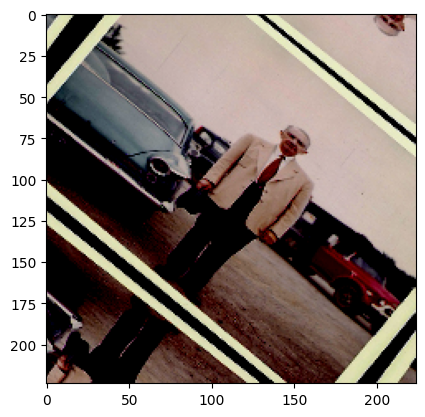

In [10]:
config = Config(
    embed_dim=768,
    seq_len=1024,
    n_head=12,
    bias=True,
    dropout_p=0.1,
    mlp_ratio=4,
    depth=12,
    vocab_size=50_257,
)

batch_size = 50

train_loader = torch.utils.data.DataLoader(
    train_ds, shuffle=False, batch_size=batch_size, collate_fn=collate_fn
)
val_loader = torch.utils.data.DataLoader(
    val_ds, shuffle=False, batch_size=batch_size, collate_fn=collate_fn
)
img, c, l = next(iter(train_loader))
show_image(img[0])
print(f"{c[0]=}")
print(tokenizer.decode(c[0]))
print(f"{l[0]=}")

In [11]:
the_trainer = Trainer(vit, config, train_loader, val_loader)

total_frozen_params=210236928
trainable parameters: 28366848


In [14]:
save_adv(the_trainer, "coco_vqa_5")

In [142]:
clear_gpu()

In [12]:
the_trainer.load_model("models/caption_transformer_5.pth")

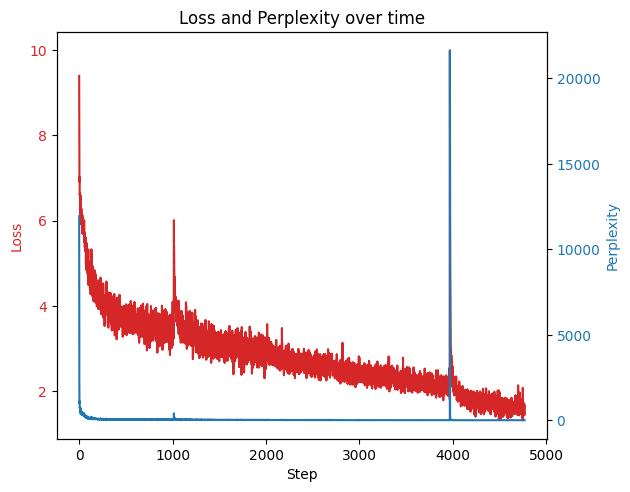

100%|██████████| 800/800 [22:12<00:00,  1.67s/it]

[0/1] Step: [799/800] Loss: 1.67309 	 Perplexity: 5.32859


In [13]:
the_trainer.model.unfreeze_gpt_layers()
the_trainer.train(1, 1, True)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


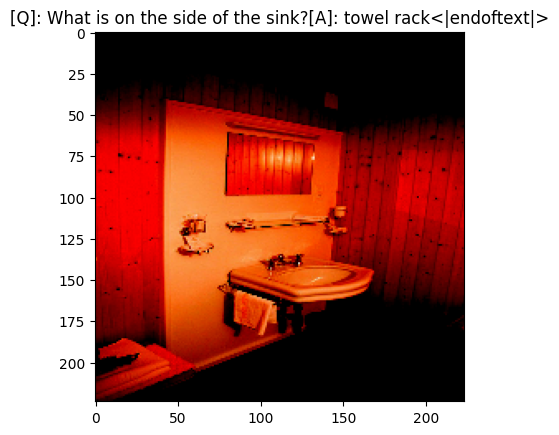

In [16]:
test_image, test_input, test_label = val_ds[1244]
show_image(test_image, tokenizer.decode(test_input))

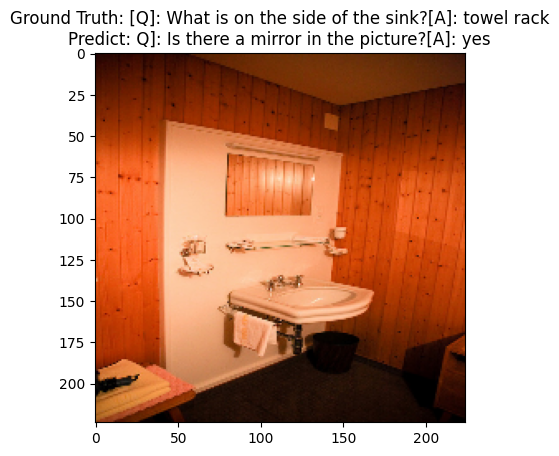

In [17]:
_ = val_inference(1244)

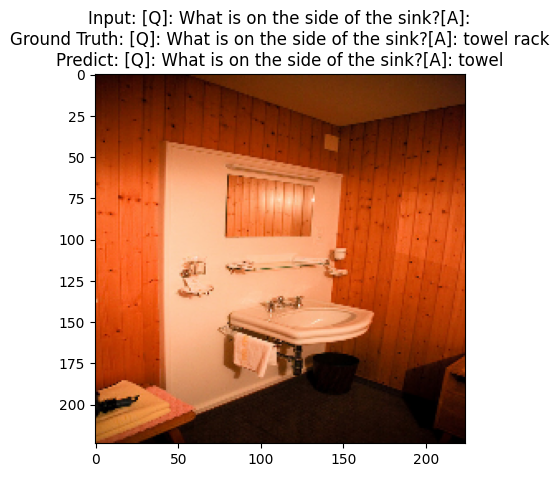

In [18]:
_ = val_inference_vqa(1244)

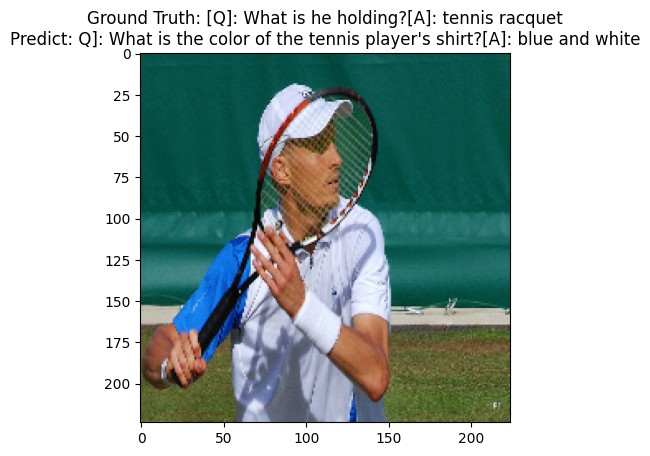

In [22]:
_ = val_inference(3666)

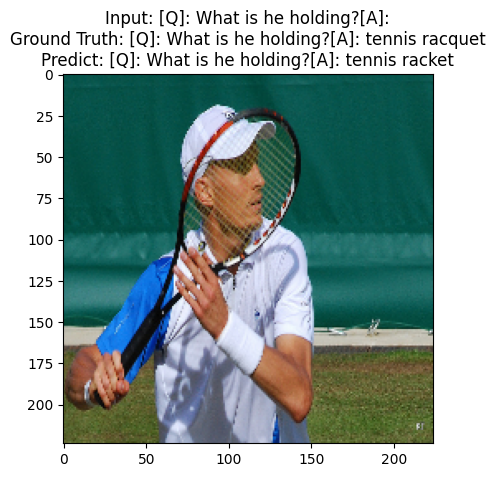

In [19]:
_ = val_inference_vqa(3666)

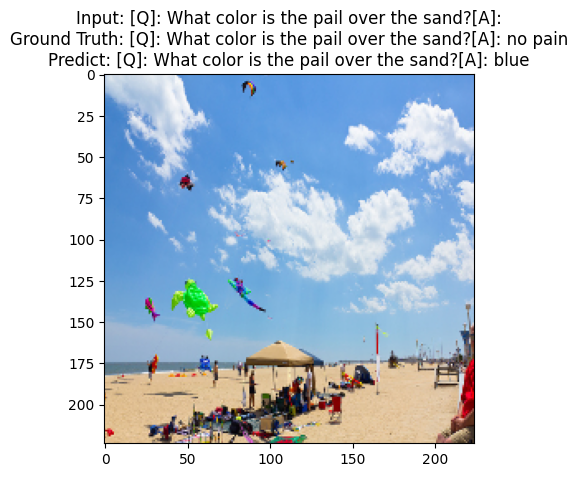

In [24]:
_ = val_inference_vqa(123)

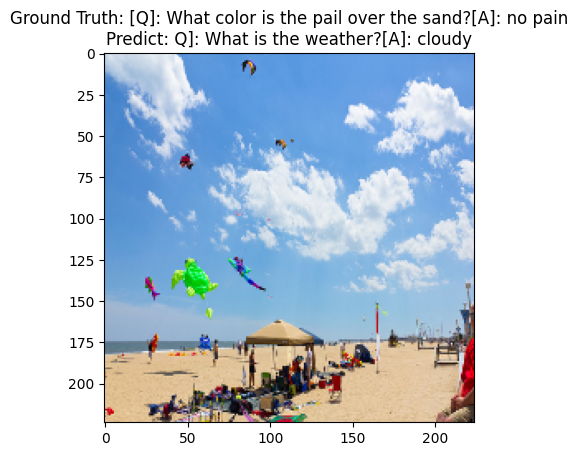

In [23]:
_ = val_inference(123)

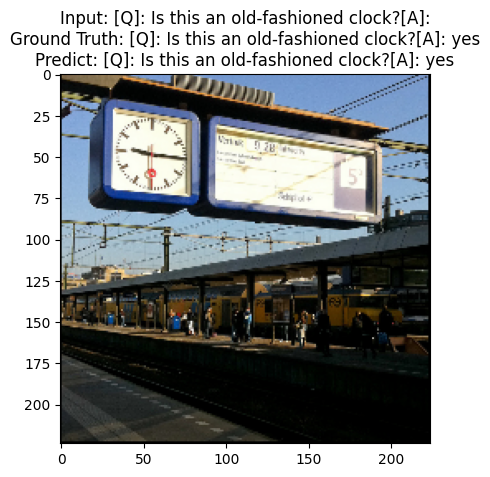

In [31]:
_ = val_inference_vqa(4123)

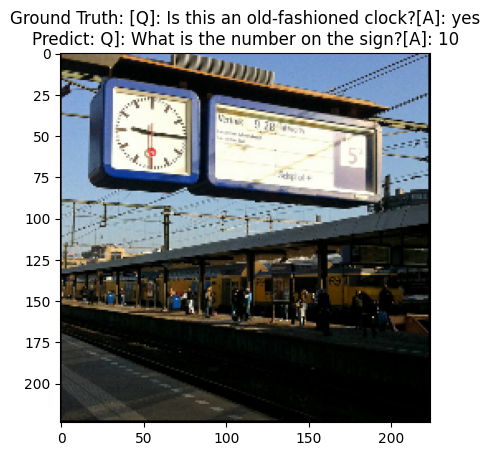

In [32]:
_ = val_inference(4123)

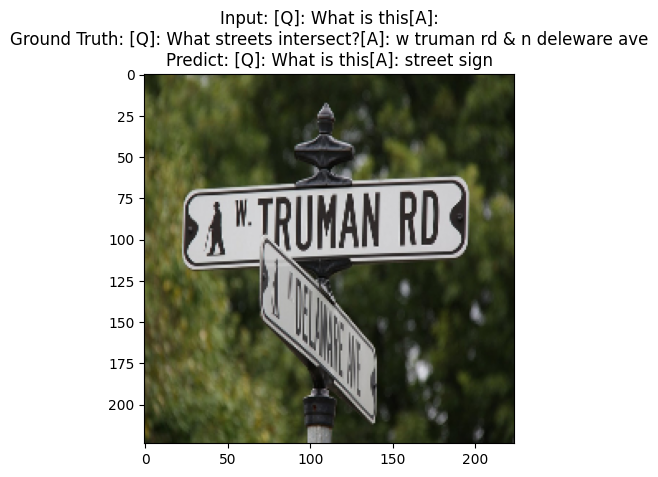

In [47]:
_ = val_inference_vqa_custom_input(3426, "[Q]: What is this[A]:")

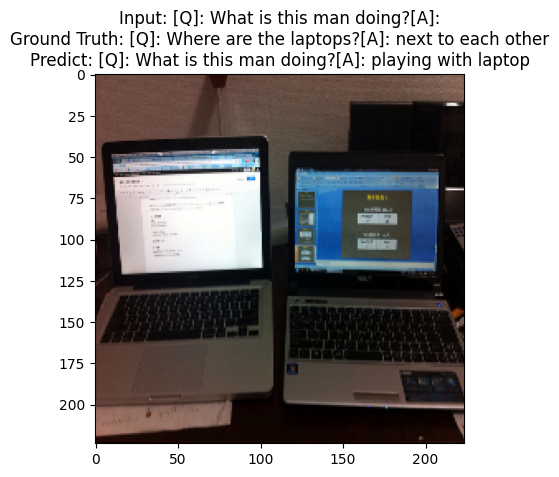

In [54]:
_ = val_inference_vqa_custom_input(5426, "[Q]: What is this man doing?[A]:")

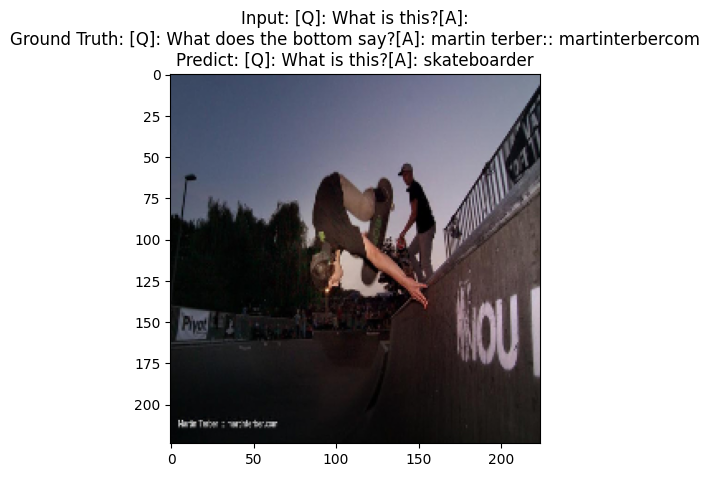

In [70]:
_ = val_inference_vqa_custom_input(121, "[Q]: What is this?[A]:")